__собираем статистики по объявлениям о продаже земли__

_Evgeny S. Borisov <parser@mechanoid.su>_

In [1]:
!date

Пн 09 сен 2024 14:22:53 MSK


# загружаем данные

In [2]:
import pandas as pd
import geopandas as gpd

pd.set_option('display.max_colwidth', None)
pd.set_option('display.float_format', '{:.2f}'.format)

In [3]:
df = pd.read_pickle('data/2024/df_land.pkl')
df['dt'] = df['ts'].dt.date
display( len(df) )
cols = ['title','address','latitude','longitude','priceM','dt']
display( df.sample(3)[cols] )

61389

,title,address,latitude,longitude,priceM,dt
668,"участок, 4 сот., садоводство","севастополь,р-н нахимовский,качинский район ,южный сот,161",44.740452,33.556837,2.25,2024-06-11
58129,участок 9 сот. (ижс),"севастополь,ул.генерала рихтера,35",44.571229,33.559433,5.00,2024-06-11
58505,участок 5 сот. (ижс),"судак,с.краснокаменка,ул.ленина,22",44.856539,34.973983,0.60,2024-06-10


---

In [4]:
def address_filter(df):
    #           46.319437, 33.911048
    #
    # 45.402617, 32.455625 |  45.545301, 36.684702
    #
    #          44.320887, 33.917013

    df['latitude'] = pd.to_numeric( df['latitude'], errors='coerce' )
    df['longitude'] = pd.to_numeric( df['longitude'], errors='coerce' )

    df = df.query('(32.4<longitude<36.7) & (44.3<latitude<46.4)') 

#     df.loc[ df['address']=='Севастополь,Чёрное море', ['latitude','longitude'] ] = None
#     df.loc[ df['address'].str.lower().str.match('чёрное море'), ['latitude','longitude'] ] = None 
#     df.loc[ df['address']=='квартал Старый Город', 'place'] = 'turkie'
#     df.loc[ df['address'].str.lower().str.match('анталья'), 'place' ] = 'turkie' 


#     df.loc[ df['address'].str.lower().str.match(r'.*мысовское.*'), 'place' ] = 'kerch'
#     df.loc[ df['address'].str.lower().str.match(r'.*с.лучистое.*'), 'place' ] = 'alushta'
#     df.loc[ df['address'].str.lower().str.match(r'.*пгт.новоозёрное.*'), 'place' ] = 'evpatoria'
#     df.loc[ df['address'].str.lower().str.match(r'.*тсн аэрофлот.*'), 'place' ] = 'simferopol'
#     df.loc[ df['address'].str.lower().str.match(r'.*семисот.*'), 'place' ] = 'kerch'
#     df.loc[ df['address'].str.lower().str.match(r'.*заветное.*') , 'place' ] = 'kerch'


    df.loc[ df['address'].str.lower().str.match(r'.*керчь\b.*') , 'place' ] = 'kerch'
    df.loc[ df['address'].str.lower().str.match(r'.*бахчисарай\b.*'), 'place' ] = 'bahchisaray'
    df.loc[ df['address'].str.lower().str.match(r'.*севастополь\b,.*'), 'place' ] = 'sevastopol'
    df.loc[ df['address'].str.lower().str.match(r'.*ялта\b.*') , 'place' ] = 'yalta'
    df.loc[ df['address'].str.lower().str.match(r'.*феодосия\b.*') , 'place' ] = 'feodosia'
    df.loc[ df['address'].str.lower().str.match(r'.*евпатория\b.*') , 'place' ] = 'evpatoria'
    df.loc[ df['address'].str.lower().str.match(r'.*алушта\b.*'), 'place' ] = 'alushta'
    
   
    df.loc[ df['address'].str.lower().str.match(r'.*ленинский район.*') , 'place' ] = 'kerch'
    df.loc[ df['address'].str.lower().str.match(r'.*симферопольский район.*'), 'place' ] = 'simferopol'
    df.loc[ df['address'].str.lower().str.match(r'.*белогорский район.*'),'place'] = 'belogorsk'
    df.loc[ df['address'].str.lower().str.match(r'.*кировский район.*'),'place'] = 'kirovsky'
    df.loc[ df['address'].str.lower().str.match(r'.*нижнегорский район.*'),'place'] = 'nizhnegorsky'
    df.loc[ df['address'].str.lower().str.match(r'.*бахчисарайcкий район.*'), 'place' ] = 'bahchisaray'
    df.loc[ df['address'].str.lower().str.match(r'.*сакский район.*'), 'place' ] = 'saki'

    df.loc[ df['address'].str.lower().str.match(r'.*окуневка\b.*') , 'place' ] = 'tarkhankut'
    df.loc[ df['address'].str.lower().str.match(r'.*гурзуф\b.*'), 'place' ] = 'gurzuf'
    df.loc[ df['address'].str.lower().str.match(r'.*кореиз\b.*'), 'place' ] = 'koreiz'
    df.loc[ df['address'].str.lower().str.match(r'.*малый маяк\b.*'),'place'] = 'alushta'
    df.loc[ df['address'].str.lower().str.match(r'.*снт солнечная долина.*'), 'place' ] = 'sudak'
    df.loc[ df['address'].str.lower().str.match(r'.*с.мирное.*'), 'place' ] = 'simferopol'
    df.loc[ df['address'].str.lower().str.match(r'.*коктебель\b.*'),'place'] = 'koktebel'

    df = df.dropna(subset=['latitude','longitude'])
    
    return df

In [5]:
display( len(df) )
df = address_filter(df)
display( len(df) )

61389

61354

In [6]:
# df.loc[df['address'].str.match(r'.*сакский район.*'),'place'] = 'saki'
# df.loc[df['address'].str.match(r'.*керчь.*'),'place'] = 'kerch'
# df.loc[df['address'].str.match(r'.*белогорский.*'),'place'] = 'belogorsk'
# df.loc[df['address'].str.match(r'.*кировский.*'),'place'] = 'kirovski'
# df.loc[df['address'].str.match(r'.*кореиз.*'),'place'] = 'ubk'
# df.loc[df['address'].str.match(r'.*малый маяк.*'),'place'] = 'ubk'
# df.loc[df['address'].str.match(r'.*светлый мир.*'),'place'] = 'simferopol'
# df.loc[df['address'].str.match(r'.*доброе.*'),'place'] = 'simferopol'
# df.loc[df['address'].str.match(r'.*родниково.*'),'place'] = 'simferopol'
# df.loc[df['address'].str.match(r'.*уютное.*'),'place'] = 'evpatoria'
# df.loc[df['address'].str.match(r'.*коктебель.*'),'place'] = 'koktebel'
# df.loc[df['address'].str.match(r'.*новосельское.*'),'place'] = 'tarhankut'

---

In [7]:
# df_ = pd.read_pickle('data/2023/data_land.pkl').rename(columns={'adr':'address'})
# df_['dt'] = df_['ts'].dt.date
# display( len(df_) )
# display( df_.sample(3)[cols] )

In [8]:
# df_ = (
#         df_
#         .dropna(subset=['dt','url'])
#         .drop_duplicates(['dt','url'])
#         .drop(columns=['adr_orig','obj_name','avito_page'])
#     )
# display( len(df_) )
# cols = ['title','address','latitude','longitude','priceM','dt','url']
# display( df_.sample(3)[cols] )

In [9]:
# # history_date = df_['dt'].max()
# history_date = pd.to_datetime('2023-01-10').date()
# display(history_date)

In [10]:
# df = pd.concat([df,df_]).reset_index(drop=True)
# display( len(df) )
# del df_

In [11]:
# df['latitude'] = pd.to_numeric( df['latitude'], errors='coerce' )
# df['longitude'] = pd.to_numeric( df['longitude'], errors='coerce' )

---

In [12]:
import numpy as np
df['log_priceM'] = df['priceM'].apply(lambda x: np.log(x+1.))

---

In [13]:
df['month'] = df['ts'].dt.to_period('M')
df['week'] = df['ts'].dt.to_period('W')

---

In [14]:
display( len(df) )
df = df.dropna(subset=['latitude','longitude'])
display( len(df) )

61354

61354

In [15]:
# print(len(df))
# # выкидываем "ущербные" варианты 
# df = df.query('is_IJS')
# print(len(df))

In [16]:
gdf = gpd.GeoDataFrame( df, geometry = gpd.points_from_xy( df['longitude'], df['latitude']), crs='epsg:4326', )
# [['title','address','latitude','longitude','priceM']] 
display( gdf.sample(3)[cols])

,title,address,latitude,longitude,priceM,dt
56977,"участок 7 сот. (снт, днп)","бахчисарай,с.красный мак,садовая ул.,5",44.64,33.78,2.00,2024-06-19
31582,участок 10 сот. (ижс),"севастополь,олимпийская ул.,1а",44.56,33.46,20.00,2024-08-26
10380,"участок, 250 м², 2 сот., ижс","республика крым,судак,улица якова кушнира,15",44.85,34.96,3.00,2024-06-17


In [17]:
display( len(gdf) )
gdf = (
    gdf
    .query("place in ('sevastopol','sudak','bahchisaray')")
    # .drop_duplicates(['dt','url'])
    .drop_duplicates(['url','week'])
    .reset_index(drop=True)
)
display( len(gdf) )

61354

46322

In [18]:
# display( len(df) )
# gdf = gdf.query('place in ("bahchisaray","sudak","sevastopol")')
# display( len(df) )

---

In [19]:
dt_max = df['dt'].max()
dt_min = df['dt'].min()
display( dt_min,dt_max )
# display( dt_min,history_date,dt_max )

datetime.date(2024, 6, 7)

datetime.date(2024, 9, 9)

In [20]:
# display( len(gdf_history) )
display( len(gdf) )

46322

In [21]:
gdf['log_priceMU']  =gdf['priceMU'].apply(np.log)

In [22]:
# gdf['priceMU']

# общая статистика

In [23]:
gdf[['title','address','priceM','geometry']].sample(512).explore()

In [24]:
gdf.query('place=="sevastopol"')[['title','address','priceM','geometry']].sample(512).explore()

In [25]:
( 
    gdf.query('place=="sudak"')
    [['title','address','priceM','area_size_category','geometry']]
    #.explore('area_size_category', legend=True) 
    .explore()    
)

In [28]:
(
    gdf.query('place=="bahchisaray"')
    [['title','address','priceM','area_size_category','geometry']]
    #.sample(100)
    .explore() #'area_size_category', legend=True) 
)

In [29]:
# cols = ['title','adr','priceM','house_size_category','place','url','geometry']

In [30]:
percentiles=[.01,.05,.1,.25,.5,.75,.9,.95]
stat = gdf.groupby(['place','area_size_category','week'],observed=True)['priceM'].describe(percentiles=percentiles)
# stat = gdf.groupby(['place','area_size_category','month'],observed=True)['priceM'].describe(percentiles=percentiles)
display( stat )

count  mean   std  min  \
place       area_size_category week                                            
bahchisaray <1                 2024-06-03/2024-06-09   2.00  0.90  0.14 0.80   
                               2024-06-10/2024-06-16   2.00  0.90  0.14 0.80   
                               2024-06-17/2024-06-23   2.00  0.90  0.14 0.80   
                               2024-06-24/2024-06-30   2.00  0.90  0.14 0.80   
                               2024-07-08/2024-07-14   2.00  0.50  0.71 0.00   
...                                                     ...   ...   ...  ...   
sudak       20+                2024-08-12/2024-08-18  42.00 15.27 38.42 1.00   
                               2024-08-19/2024-08-25  33.00 17.43 43.05 1.00   
                               2024-08-26/2024-09-01  34.00 15.20 42.51 1.00   
                               2024-09-02/2024-09-08  39.00  9.08 10.10 1.00   
                               2024-09-09/2024-09-15  35.00 15.68 38.53 1.00   

                                                       1%   5%  10%  25%  50%  \
place       area_size_category week                                             
bahchisaray <1                 2024-06-03/2024-06-09 0.80 0.81 0.82 0.85 0.90   
                               2024-06-10/2024-06-16 0.80 0.81 0.82 0.85 0.90   
                               2024-06-17/2024-06-23 0.80 0.81 0.82 0.85 0.90   
                               2024-06-24/2024-06-30 0.80 0.81 0.82 0.85 0.90   
                               2024-07-08/2024-07-14 0.01 0.05 0.10 0.25 0.50   
...                                                   ...  ...  ...  ...  ...   
sudak       20+                2024-08-12/2024-08-18 1.00 1.42 1.93 2.81 5.95   
                               2024-08-19/2024-08-25 1.13 1.91 2.30 3.60 7.00   
                               2024-08-26/2024-09-01 1.00 1.26 2.00 2.59 5.65   
                               2024-09-02/2024-09-08 1.00 1.36 1.98 2.67 5.30   
                               2024-09-09/2024-09-15 1.14 1.75 2.50 4.00 6.60   

                                                       75%   90%   95%    max  
place       area_size_category week                                            
bahchisaray <1                 2024-06-03/2024-06-09  0.95  0.98  0.99   1.00  
                               2024-06-10/2024-06-16  0.95  0.98  0.99   1.00  
                               2024-06-17/2024-06-23  0.95  0.98  0.99   1.00  
                               2024-06-24/2024-06-30  0.95  0.98  0.99   1.00  
                               2024-07-08/2024-07-14  0.75  0.90  0.95   1.00  
...                                                    ...   ...   ...    ...  
sudak       20+                2024-08-12/2024-08-18 15.00 21.80 30.00 250.00  
                               2024-08-19/2024-08-25 15.00 28.00 38.80 250.00  
                               2024-08-26/2024-09-01 10.00 16.40 31.20 250.00  
                               2024-09-02/2024-09-08 12.40 17.60 30.00  52.00  
                               2024-09-09/2024-09-15 14.60 18.80 36.60 230.00  

[292 rows x 13 columns]

In [31]:
stat.reset_index()['area_size_category'].unique()

['<1', '1-2', '2-4', '4-8', '8-12', '12-20', '20+']
Categories (7, object): ['<1' < '1-2' < '2-4' < '4-8' < '8-12' < '12-20' < '20+']

In [32]:
import matplotlib.pyplot as plt

cols = ['1%','10%','25%','50%','75%']
# sizes = [ '2-4', '4-8', '8-20']
sizes = ['4-8', '8-12', '12-20']
display( sizes )

['4-8', '8-12', '12-20']

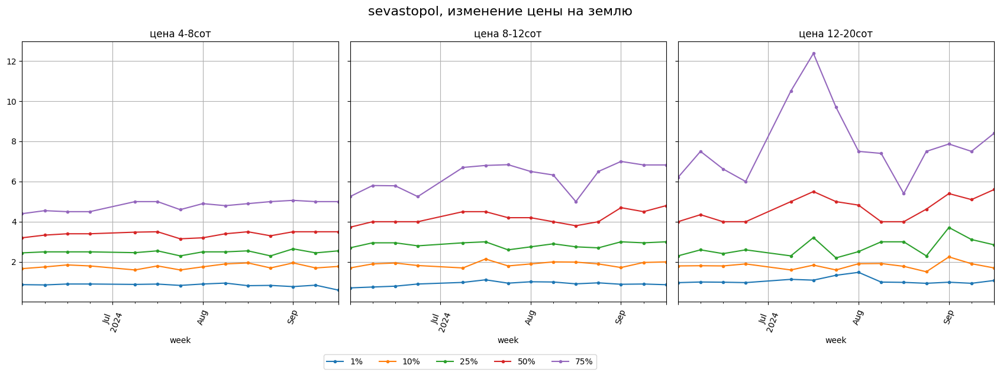

In [33]:
place = 'sevastopol'

fig, ax = plt.subplots(1,len(sizes),figsize=(17,6), sharey=True )

for i,s in enumerate(sizes): 
    stat.loc[(place,s),cols].plot(title=f'цена {s}сот', grid=True,ax=ax[i],legend=False, rot=70, style='.-' )   

fig.suptitle(f'{place}, изменение цены на землю', fontsize=16)
fig.legend( labels=cols,frameon=True, ncol=len(cols), bbox_to_anchor=(0.6, 0.01))    
fig.tight_layout()

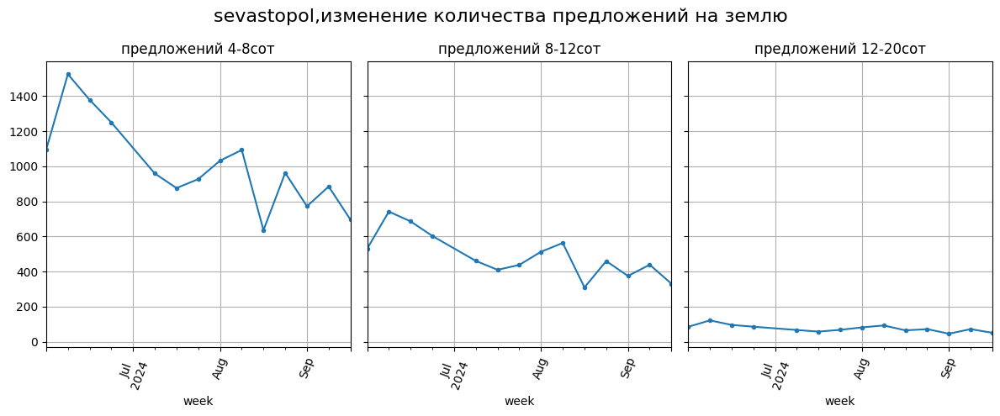

In [34]:
fig, ax = plt.subplots(1,len(sizes),figsize=(12,5), sharey=True )

for i,s in enumerate(sizes): 
    stat.loc[(place,s),'count'].plot(title=f'предложений {s}сот', grid=True,ax=ax[i],legend=False, rot=70, style='.-' )   

fig.suptitle(f'{place},изменение количества предложений на землю', fontsize=16)
fig.tight_layout()

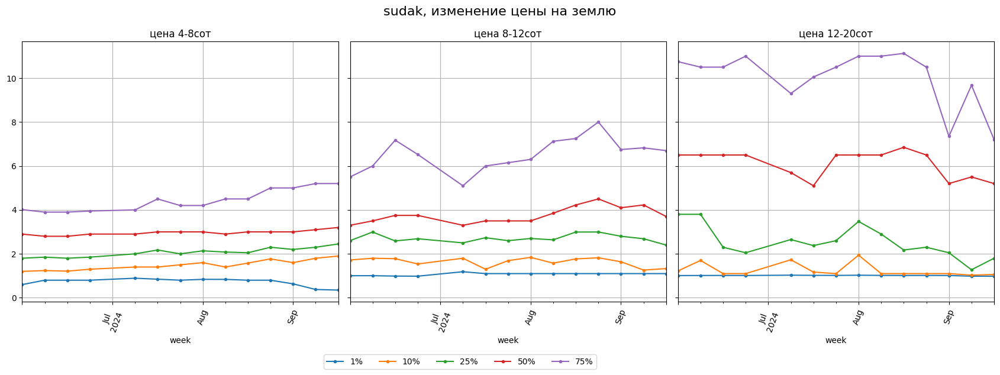

In [35]:
place = 'sudak'

fig, ax = plt.subplots(1,len(sizes),figsize=(17,6), sharey=True )

for i,s in enumerate(sizes): 
    stat.loc[(place,s),cols].plot(title=f'цена {s}сот', grid=True,ax=ax[i],legend=False, rot=70, style='.-' )   

fig.suptitle(f'{place}, изменение цены на землю', fontsize=16)
fig.legend( labels=cols,frameon=True, ncol=len(cols), bbox_to_anchor=(0.6, 0.01))    
fig.tight_layout()

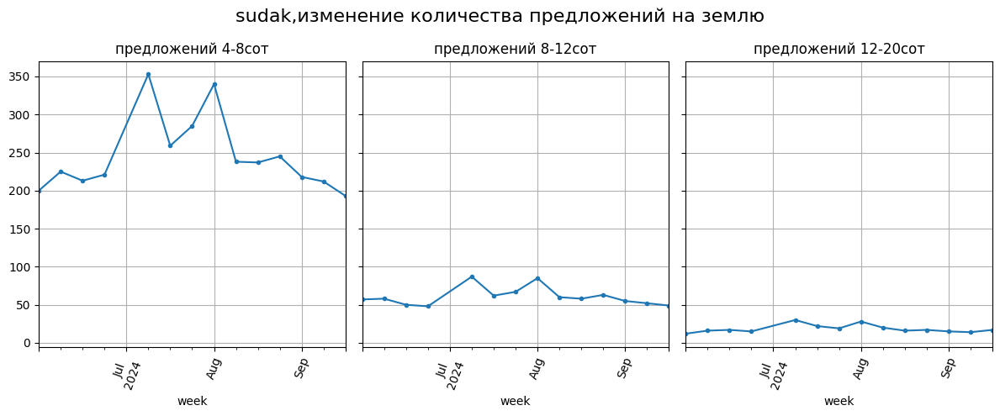

In [36]:
fig, ax = plt.subplots(1,len(sizes),figsize=(12,5), sharey=True )

for i,s in enumerate(sizes): 
    stat.loc[(place,s),'count'].plot(title=f'предложений {s}сот', grid=True,ax=ax[i],legend=False, rot=70, style='.-' )   

fig.suptitle(f'{place},изменение количества предложений на землю', fontsize=16)
fig.tight_layout()

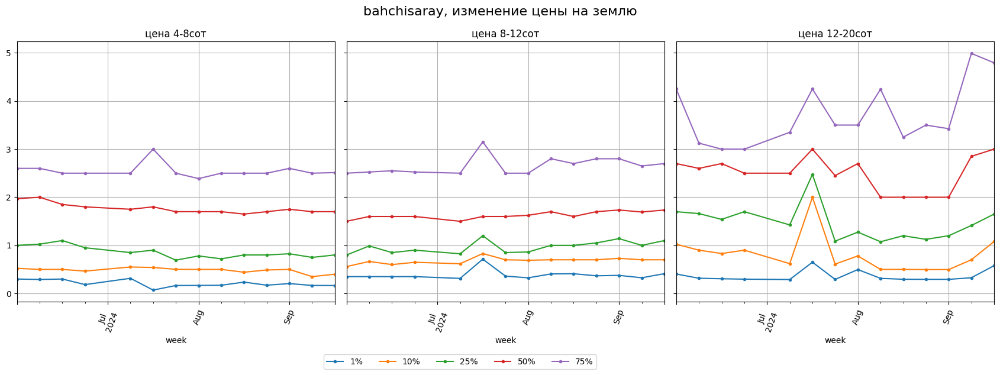

In [37]:
place = 'bahchisaray'

fig, ax = plt.subplots(1,len(sizes),figsize=(17,6), sharey=True )

for i,s in enumerate(sizes): 
    stat.loc[(place,s),cols].plot(title=f'цена {s}сот', grid=True,ax=ax[i],legend=False, rot=70, style='.-' )   

fig.suptitle(f'{place}, изменение цены на землю', fontsize=16)
fig.legend( labels=cols,frameon=True, ncol=len(cols), bbox_to_anchor=(0.6, 0.01))    
fig.tight_layout()

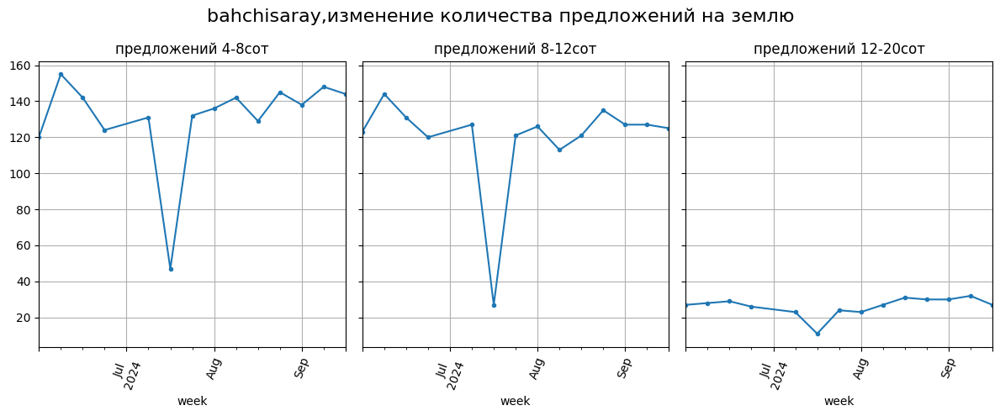

In [38]:
fig, ax = plt.subplots(1,len(sizes),figsize=(12,5), sharey=True )

for i,s in enumerate(sizes): 
    stat.loc[(place,s),'count'].plot(title=f'предложений {s}сот', grid=True,ax=ax[i],legend=False, rot=70, style='.-' )   

fig.suptitle(f'{place},изменение количества предложений на землю', fontsize=16)
fig.tight_layout()

# актуальная цена

In [39]:
# dt_now = pd.to_datetime('2024-06-17').date()
dt_now = gdf['dt'].max()
display(len(gdf))
gdf_last = gdf[ gdf['dt'] == dt_now ]
display(len(gdf_last))

46322

2390

In [40]:
# display(len(gdf))
# gdf_last = gdf[ gdf['dt'] == gdf['dt'].max() ]
# display(len(gdf_last))

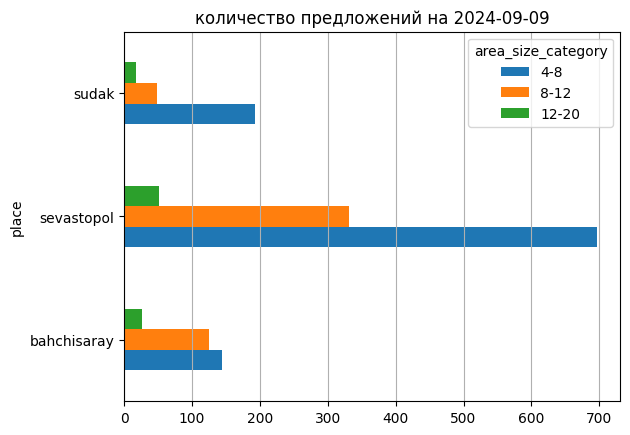

In [41]:
(
gdf_last
.drop_duplicates('url')
.query('area_size_category in @sizes')
.groupby(['area_size_category','place'],observed=True)['url'].count().reset_index()
.pivot(index='place', columns='area_size_category', values='url')
.plot.barh(title='количество предложений на '+ str( dt_now ))
.grid(axis='x')    
)

In [42]:
(
    gdf_last
    .query('area_size_category in @sizes')
    .drop_duplicates('url')
    .groupby(['place','area_size_category'],observed=True)
    ['priceM'].describe(percentiles=percentiles)
)

count  mean  std  min   1%   5%  10%  25%  \
place       area_size_category                                              
bahchisaray 4-8                144.00  1.87 1.20 0.00 0.17 0.30 0.40 0.80   
            8-12               125.00  2.00 1.65 0.30 0.41 0.52 0.70 1.10   
            12-20               27.00  4.91 7.57 0.50 0.58 0.83 1.08 1.65   
sevastopol  4-8                696.00  4.30 3.77 0.25 0.60 1.20 1.77 2.55   
            8-12               331.00  5.95 7.45 0.30 0.86 1.42 2.00 3.00   
            12-20               51.00  7.69 6.91 0.95 1.07 1.55 1.70 2.85   
sudak       4-8                193.00  4.11 3.17 0.35 0.35 1.36 1.90 2.45   
            8-12                49.00  6.85 8.94 1.10 1.10 1.20 1.33 2.40   
            12-20               17.00  5.78 4.24 0.98 0.98 1.00 1.06 1.80   

                                50%  75%   90%   95%    max  
place       area_size_category                               
bahchisaray 4-8                1.70 2.51  3.59  3.70   6.90  
            8-12               1.74 2.70  3.16  3.50  16.20  
            12-20              3.00 4.79  8.40 12.00  40.00  
sevastopol  4-8                3.50 5.00  7.00  9.01  70.00  
            8-12               4.80 6.82 10.00 13.75 120.00  
            12-20              5.60 8.40 17.50 23.75  30.00  
sudak       4-8                3.20 5.20  7.00  7.66  30.00  
            8-12               3.70 6.70 13.50 23.80  52.50  
            12-20              5.20 7.20 11.66 13.52  14.00

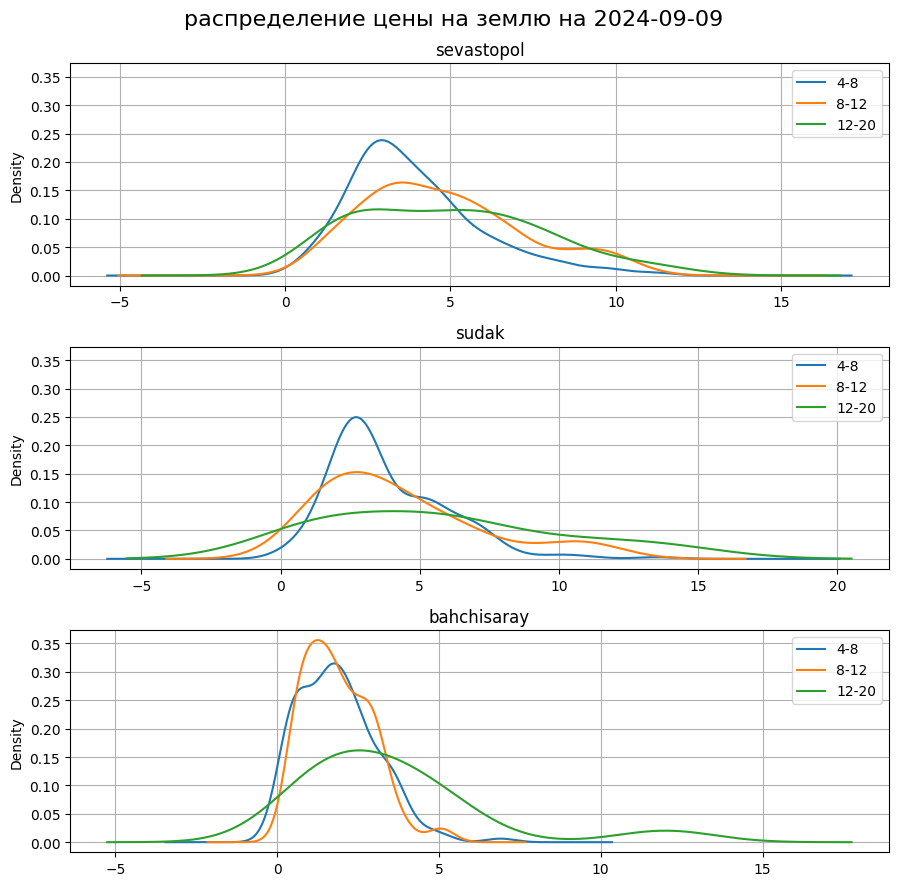

In [43]:
q_95 = gdf_last.groupby(['place'])['priceM'].quantile(.95)

places = ['sevastopol','sudak','bahchisaray']

fig, ax = plt.subplots(len(places),1,figsize=(9,9), sharey=True )
for i,p in enumerate(places): 
    (
        gdf_last
        .query(f'(place=="{p}")&(priceM<{q_95[p]})')
        .query('area_size_category in @sizes')
        .drop_duplicates('url')
        .groupby(['area_size_category'],observed=True)
        ['priceM']
        .plot.kde(legend=True,ax=ax[i],title=f'{p}', grid=True)   
    )
fig.suptitle(f'распределение цены на землю на '+ str( dt_now ), fontsize=16)
fig.tight_layout()

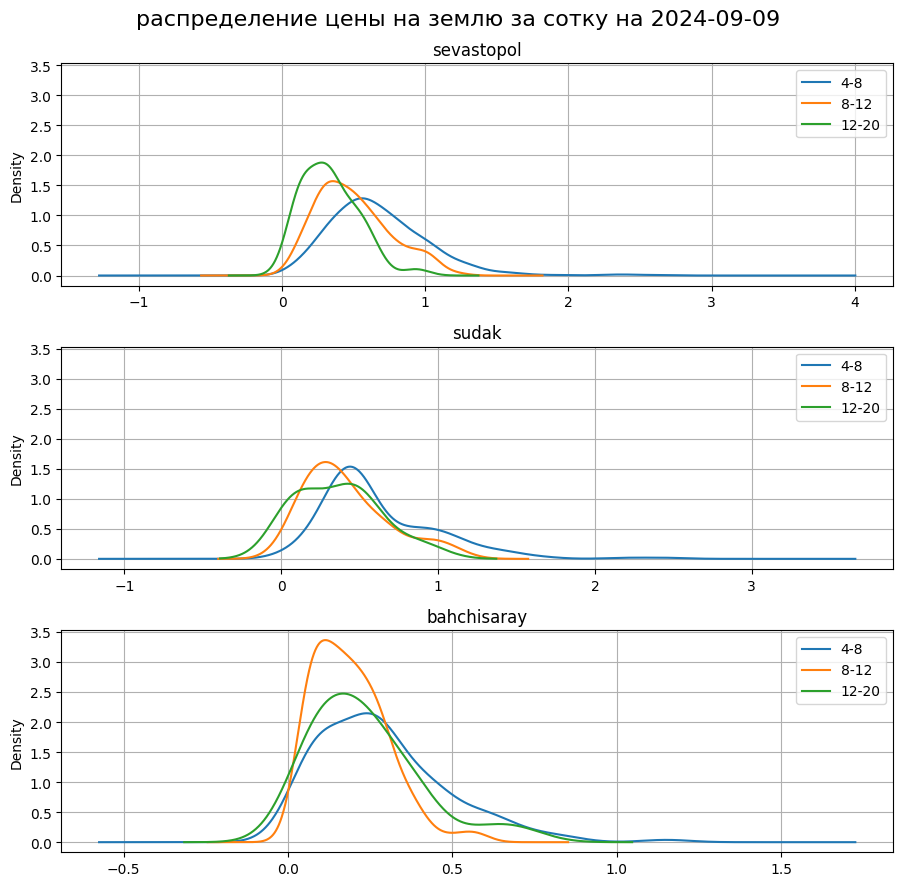

In [44]:
# q_95 = gdf_last.groupby(['place'])['priceM'].quantile(.95)

places = ['sevastopol','sudak','bahchisaray']

fig, ax = plt.subplots(len(places),1,figsize=(9,9), sharey=True )
for i,p in enumerate(places): 
    (
        gdf_last
        .query(f'(place=="{p}")&(priceM<{q_95[p]})')
        .query('area_size_category in @sizes')
        .drop_duplicates('url')
        .groupby(['area_size_category'],observed=True)
        ['priceMU']
        .plot.kde(legend=True,ax=ax[i],title=f'{p}', grid=True)   
    )
fig.suptitle(f'распределение цены на землю за сотку на '+ str( dt_now ), fontsize=16)
fig.tight_layout()

# цены на карте

In [45]:
import h3
from shapely.geometry import Polygon
from shapely.geometry import MultiPoint

In [46]:
def cover_grid_hexagonal(gmtr,cell_size=6,crs='EPSG:4326'):
    polygonise = lambda hex_id: Polygon( h3.h3_to_geo_boundary( hex_id, geo_json=True)  )
    hexs = list(h3.polyfill( gmtr.__geo_interface__, cell_size, geo_json_conformant = True ))
    return gpd.GeoDataFrame({ 'hex_id': hexs,  'geometry': list(map(polygonise, hexs)), },crs=crs,)

## Севастополь

In [47]:
frame_sevastopol = gpd.GeoDataFrame([{ # все предложения
            'place':'sevastopol', 
            'geometry':MultiPoint( gdf_last.query('place=="sevastopol"')['geometry'].tolist() ).convex_hull, 
        }],crs='EPSG:4326')

frame_sevastopol.explore()

In [48]:
# gdf_last.query('place=="sevastopol"')[['priceM']].describe([.9,.95,.99]).T

In [49]:
grid = cover_grid_hexagonal( frame_sevastopol.geometry.values[0],cell_size=7 )

In [50]:
# медиана цены за сотку

grid_values = ( 
    grid
    # .sjoin( gdf_last.query('(place=="sevastopol")&(priceM<10.0)'), how='inner',)
    .sjoin( 
        gdf_last
        .query('place=="sevastopol"')
        .query('area_size_category in @sizes')
        .drop_duplicates('url')
        ,  how='inner',)
    .groupby(['hex_id'])
    # [['log_priceM','priceMU']]
    [['log_priceMU','priceMU']]
    .median()
    .reset_index()
)

(
    grid
    .merge(grid_values,on='hex_id')
    # [['priceM','geometry','log_priceM',]]
    # .explore(column='log_priceM',cmap='rainbow')
    
    [['priceMU','log_priceMU','geometry']]
    .explore(column='log_priceMU',cmap='rainbow')
)

## Судак

In [51]:
frame_sudak = gpd.GeoDataFrame([{ # все предложения
            'place':'sudak', 
            'geometry':MultiPoint( gdf_last.query('place=="sudak"')['geometry'].tolist() ).convex_hull, 
        }],crs='EPSG:4326')

In [52]:
# gdf_last.query('place=="sudak"')[['priceM']].describe([.9,.95,.99]).T

In [53]:
grid = cover_grid_hexagonal( frame_sudak.geometry.values[0],cell_size=8 )

In [54]:
grid_values = ( 
    grid
    .sjoin( 
        gdf_last
        .query('place=="sudak"')
        .query('area_size_category in @sizes')
        .drop_duplicates('url')
        , how='inner',)
    .groupby(['hex_id'])
   [['log_priceMU','priceMU']]
    .median()
    .reset_index()
)

(
    grid
    .merge(grid_values,on='hex_id')
    [['priceMU','log_priceMU','geometry',]]
    .explore(column='log_priceMU',cmap='rainbow')
)

# районы Севастополя

In [55]:
# загружаем области поиска
frames_path = 'data/frames/'
frames_index = pd.read_csv(f'{frames_path}/_index.tsv',sep='\t')

swap_coo = lambda coo : [ (c[1],c[0]) for c in coo ]
df2poly = lambda df : Polygon(swap_coo(df.values))

frames = gpd.GeoDataFrame([ 
        { 'area_name':nm, 'geometry': df2poly( pd.read_csv(f'{frames_path}/{f}',header=None) ) } 
        for nm,f in frames_index.values
    ],crs='epsg:4326',)

In [56]:
display(frames)

,area_name,geometry
0,"Севастополь, район Острякова","POLYGON ((33.51618 44.58832, 33.52597 44.58817, 33.53399 44.57315, 33.54248 44.55177, 33.52583 44.55023, 33.51174 44.57861, 33.51253 44.58565, 33.51253 44.58565, 33.51618 44.58832))"
1,"Севастополь, парк 60-летия СССР","POLYGON ((33.51805 44.58404, 33.51458 44.58408, 33.51263 44.58031, 33.51435 44.57460, 33.52004 44.57520, 33.51805 44.58404))"
2,"Севастополь, Хрусталёва/Хрюкина","POLYGON ((33.52003 44.57511, 33.52527 44.56364, 33.52116 44.56136, 33.51942 44.56406, 33.51951 44.56384, 33.51874 44.56882, 33.51426 44.57444, 33.52003 44.57511))"
3,"Севастополь, Геловани/Коломийца","POLYGON ((33.52139 44.57296, 33.53034 44.57518, 33.53318 44.57413, 33.53369 44.57139, 33.53244 44.56878, 33.53123 44.56774, 33.52440 44.56640, 33.52139 44.57296))"
4,"Севастополь, Музыки/Бирюзова","POLYGON ((33.52027 44.57528, 33.51724 44.58719, 33.52038 44.58724, 33.52554 44.58091, 33.52561 44.57790, 33.52027 44.57528))"
5,"Севастополь, кр.горка (старый)","POLYGON ((33.52932 44.59395, 33.53014 44.59336, 33.53265 44.59419, 33.53374 44.59431, 33.53651 44.59412, 33.54230 44.59142, 33.54644 44.58708, 33.54577 44.58522, 33.54406 44.58269, 33.54076 44.58366, 33.53883 44.58383, 33.53664 44.58511, 33.53142 44.58626, 33.53025 44.58780, 33.53048 44.58861, 33.53046 44.58847, 33.53167 44.59039, 33.53092 44.59122, 33.52951 44.59116, 33.52879 44.59244, 33.52895 44.59355, 33.52932 44.59395))"
6,"Севастополь, кр.горка (новый)","POLYGON ((33.54571 44.58517, 33.54652 44.58705, 33.54904 44.58565, 33.55000 44.58541, 33.55054 44.58522, 33.55089 44.58423, 33.55253 44.58415, 33.55326 44.58470, 33.55368 44.58431, 33.55371 44.58320, 33.55522 44.58246, 33.55548 44.58219, 33.55564 44.58115, 33.55564 44.58115, 33.55644 44.58055, 33.55694 44.57984, 33.55718 44.57912, 33.55936 44.57821, 33.56045 44.57706, 33.56229 44.57552, 33.56283 44.57476, 33.55749 44.57202, 33.55674 44.57395, 33.55618 44.57483, 33.55600 44.57601, 33.55286 44.57827, 33.55293 44.57910, 33.55259 44.58172, 33.55269 44.58302, 33.55003 44.58331, 33.54838 44.58436, 33.54571 44.58509, 33.54571 44.58517))"
7,"Севастополь, Малахов курган","POLYGON ((33.54313 44.60612, 33.55331 44.61155, 33.55676 44.60803, 33.55772 44.60255, 33.55385 44.60019, 33.54414 44.60247, 33.54313 44.60612))"
8,"Севастополь, Благополучный","POLYGON ((33.56498 44.57145, 33.56348 44.57083, 33.56274 44.57070, 33.56182 44.57017, 33.56179 44.56990, 33.55967 44.56941, 33.55751 44.57190, 33.55756 44.57213, 33.56302 44.57463, 33.56498 44.57145))"


In [57]:
frames.explore('area_name', legend=True)

In [58]:
area_name=[
    #'Севастополь, парк 60-летия СССР',
    #'Севастополь, Хрусталёва/Хрюкина',
    #'Севастополь, район Острякова',
    #'Севастополь, Малахов курган',
    'Севастополь, кр.горка (старый)',
    'Севастополь, кр.горка (новый)',
    'Севастополь, Благополучный',
    ]

In [59]:
# выбираем область
frame_ = frames[frames['area_name'].isin(area_name)]

# фильтруем данные по области
gdf_last_local = gdf_last.sjoin( frame_, how='inner', predicate='within') 
gdf_last_local[['title','priceM','address','geometry']].explore( legend=False)

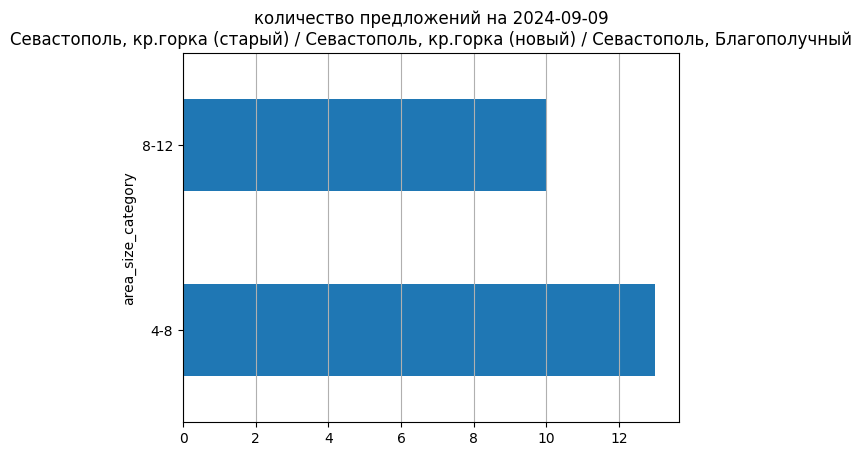

In [60]:
(
    gdf_last_local
    .query('area_size_category in @sizes')
    .drop_duplicates('url')
    .groupby(['area_size_category'], observed=True)['url'].count()
    .plot.barh(title='количество предложений на '+ str( dt_now ) + '\n' + ' / '.join(area_name) )
    .grid(axis='x')    
)

array([[<Axes: ylabel='Density'>, <Axes: ylabel='Density'>],
       [<Axes: ylabel='Density'>, <Axes: ylabel='Density'>]], dtype=object)

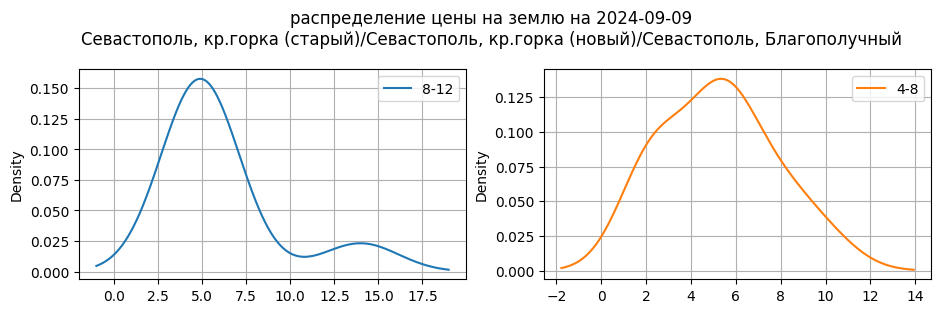

In [61]:
q_95 = gdf_last_local['priceM'].quantile(.95)
sizes_ = ['4-8', '8-12' ]
# fig, ax = plt.subplots() #figsize=(7,3) )
(
    gdf_last_local
    .query(f'(priceM<{q_95})')
    .query('area_size_category in @sizes_')
    #.groupby(['house_size_category'],observed=True)
    .pivot(columns='area_size_category',values='priceM')
    #['priceM']
    #.count()
    .plot.kde(
        legend=True,
        #ax=ax,
        # title='/'.join(area_name), 
        title=f'распределение цены на землю на '+ str( dt_now )+ '\n'+'/'.join(area_name), 
        grid=True,
        subplots=True,
        layout=(2,2),
        figsize=(11,6),
        sharex=False
    )   
)
#fig.suptitle(f'распределение цены на дома на '+ str( dt_now ), fontsize=16)
#fig.tight_layout()

In [ ]:
# q_95 = gdf_last_local['priceM'].quantile(.95)
# sizes_ = ['4-8', '8-12' ]

# fig, ax = plt.subplots(figsize=(7,3) )
# (
#     gdf_last_local
#     .query(f'(priceM<{q_95})')
#     .query('area_size_category in @sizes_')
#     .drop_duplicates('url')
#     .groupby(['area_size_category'],observed=True)
#     ['priceM']
#     # .count()
#     .plot.kde(legend=True,ax=ax,title='/'.join(area_name), grid=True)   
# )
# fig.suptitle(f'распределение цены на землю на '+ str(dt_now ), fontsize=16)
# fig.tight_layout()

----

In [62]:
# изменение цены по району
gdf_local = (
    gdf
    .query('area_size_category in @sizes_')
    .drop_duplicates('url')
    .sjoin( frame_, how='inner', predicate='within') 
)

In [63]:
# percentiles=[.01,.05,.1,.25,.5,.75,.9,.95]
stat = gdf_local.groupby(['area_size_category','week'],observed=True)['priceM'].describe(percentiles=percentiles)
# stat = gdf_local.groupby(['area_size_category','month'],observed=True)['priceM'].describe(percentiles=percentiles)
stat = stat.dropna() 
display( stat )

count  mean  std  min   1%   5%  \
area_size_category week                                                     
4-8                2024-06-10/2024-06-16  13.00  4.71 2.11 2.45 2.46 2.51   
                   2024-06-17/2024-06-23   6.00  6.68 3.72 2.00 2.12 2.62   
                   2024-07-08/2024-07-14   3.00  6.77 4.50 3.50 3.53 3.64   
                   2024-07-15/2024-07-21   7.00  4.21 2.30 1.70 1.74 1.88   
                   2024-07-22/2024-07-28   2.00  5.45 2.19 3.90 3.93 4.05   
                   2024-08-19/2024-08-25   2.00  3.70 1.70 2.50 2.52 2.62   
                   2024-08-26/2024-09-01   7.00  4.63 2.14 2.30 2.31 2.34   
8-12               2024-06-03/2024-06-09   2.00  4.20 0.99 3.50 3.51 3.57   
                   2024-06-10/2024-06-16  11.00  5.25 3.66 2.10 2.24 2.80   
                   2024-06-17/2024-06-23  10.00  6.51 3.78 2.10 2.35 3.36   
                   2024-07-15/2024-07-21   3.00 11.83 6.37 4.50 4.71 5.55   
                   2024-08-12/2024-08-18   2.00  5.45 0.78 4.90 4.91 4.96   
                   2024-08-19/2024-08-25   2.00  4.70 0.28 4.50 4.50 4.52   
                   2024-08-26/2024-09-01   2.00  5.97 3.01 3.85 3.89 4.06   
                   2024-09-09/2024-09-15   4.00  5.10 0.45 4.50 4.51 4.58   

                                          10%  25%   50%   75%   90%   95%  \
area_size_category week                                                      
4-8                2024-06-10/2024-06-16 2.68 3.40  3.99  4.99  7.70  8.60   
                   2024-06-17/2024-06-23 3.25 4.60  5.80  9.18 11.00 11.50   
                   2024-07-08/2024-07-14 3.78 4.20  4.90  8.40 10.50 11.20   
                   2024-07-15/2024-07-21 2.06 2.65  3.20  5.65  6.98  7.49   
                   2024-07-22/2024-07-28 4.21 4.67  5.45  6.22  6.69  6.84   
                   2024-08-19/2024-08-25 2.74 3.10  3.70  4.30  4.66  4.78   
                   2024-08-26/2024-09-01 2.39 2.72  5.00  5.85  6.92  7.46   
8-12               2024-06-03/2024-06-09 3.64 3.85  4.20  4.55  4.76  4.83   
                   2024-06-10/2024-06-16 3.50 3.98  4.50  4.93  5.00 10.50   
                   2024-06-17/2024-06-23 4.62 5.00  5.15  5.50 12.96 13.48   
                   2024-07-15/2024-07-21 6.60 9.75 15.00 15.50 15.80 15.90   
                   2024-08-12/2024-08-18 5.01 5.18  5.45  5.72  5.89  5.95   
                   2024-08-19/2024-08-25 4.54 4.60  4.70  4.80  4.86  4.88   
                   2024-08-26/2024-09-01 4.28 4.91  5.97  7.04  7.67  7.89   
                   2024-09-09/2024-09-15 4.65 4.88  5.20  5.43  5.47  5.49   

                                           max  
area_size_category week                         
4-8                2024-06-10/2024-06-16  9.50  
                   2024-06-17/2024-06-23 12.00  
                   2024-07-08/2024-07-14 11.90  
                   2024-07-15/2024-07-21  8.00  
                   2024-07-22/2024-07-28  7.00  
                   2024-08-19/2024-08-25  4.90  
                   2024-08-26/2024-09-01  8.00  
8-12               2024-06-03/2024-06-09  4.90  
                   2024-06-10/2024-06-16 16.00  
                   2024-06-17/2024-06-23 13.99  
                   2024-07-15/2024-07-21 16.00  
                   2024-08-12/2024-08-18  6.00  
                   2024-08-19/2024-08-25  4.90  
                   2024-08-26/2024-09-01  8.10  
                   2024-09-09/2024-09-15  5.50

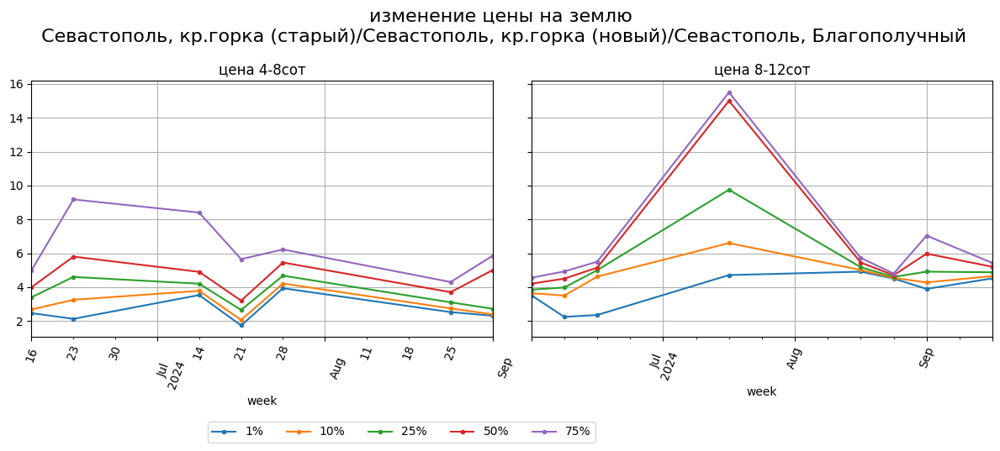

In [64]:
fig, ax = plt.subplots(1,len(sizes_),figsize=(12,5), sharey=True )

for i,s in enumerate(sizes_): 
    stat.loc[(s),cols].plot(title=f'цена {s}сот', grid=True,ax=ax[i],legend=False, rot=70, style='.-' )   

fig.suptitle(f'изменение цены на землю\n {'/'.join(area_name)}', fontsize=16)
fig.legend( labels=cols,frameon=True, ncol=len(cols), bbox_to_anchor=(0.6, 0.01))    
fig.tight_layout()

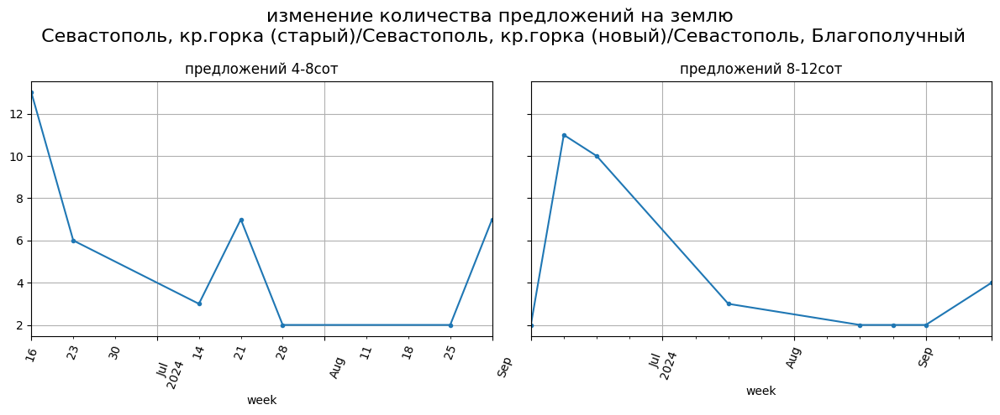

In [65]:
fig, ax = plt.subplots(1,len(sizes_),figsize=(12,5), sharey=True )

for i,s in enumerate(sizes_): 
    stat.loc[(s),'count'].plot(title=f'предложений {s}сот', grid=True,ax=ax[i],legend=False, rot=70, style='.-' )   

fig.suptitle(f'изменение количества предложений на землю\n {'/'.join(area_name)}', fontsize=16)
fig.tight_layout()